**Eigenfaces e EigenBeef**
====================

**Curso:** Doutorado em Matemática para Ciência de Dados

**Instituição:** Universidade Estadual Paulista "Júlio de Mesquita Filho" (UNESP)

**Docente:** Dr. Cássio Machiaveli Oishi

**Estudante:** Nelson Roldan Condori Colquehuanca

## Contexto

A álgebra linear constitui o fundamento matemático essencial para a ciência de dados moderna. As técnicas de decomposição matricial, particularmente a Decomposição em Valores Singulares (SVD) e a Análise de Componentes Principais (PCA), permitem extrair informação significativa de conjuntos de dados de alta dimensionalidade, reduzir a complexidade computacional e revelar padrões subjacentes nos dados de alta dimensionalidade. Estas técnicas não apenas reduzem a complexidade computacional, mas também revelam padrões subjacentes nos dados, sendo fundamentais em áreas como a teoria da aproximação e a otimização em larga escala.

## Objetivos da Apresentação

Esta apresentação explora a aplicação rigorosa de SVD e PCA no reconhecimento de padrões, focando em dois domínios específicos: o reconhecimento facial mediante Eigenfaces e a classificação de qualidade de carne mediante EigenBeef. Serão apresentadas as formulações matemáticas completas, os algoritmos de implementação e a análise quantitativa dos resultados experimentais.

* **Questão Central**: *Como podem as técnicas de álgebra linear transformar dados de alta dimensionalidade em representações compactas que preservem a informação essencial para tarefas de reconhecimento e classificação?*

# Decomposição em Valores Singulares (SVD)

> **Teorema (Existência e Unicidade da SVD)**
>> Para qualquer matriz $A \in \mathbb{R}^{m \times n}$, existem matrizes ortogonais $U \in \mathbb{R}^{m \times m}$ e $V \in \mathbb{R}^{n \times n}$, e uma matriz diagonal $\Sigma \in \mathbb{R}^{m \times n}$ com elementos diagonais não-negativos $\sigma_1 \geq \sigma_2 \geq \cdots \geq \sigma_r \geq 0$ (chamados de valores singulares), tal que:
$$A = U \Sigma V^T$$
> Os valores singulares são unicamente determinados. Se todos os $\sigma_i$ são distintos, os vetores singulares (colunas de $U$ e $V$) são únicos a menos de um sinal.


> **Relação com Autovalores e Autovetores**
> * As colunas de $U$ (vetores singulares à esquerda) são os autovetores de $AA^T$.
> * As colunas de $V$ (vetores singulares à direita) são os autovetores de $A^TA$.
> * Os valores singulares são as raízes quadradas dos autovalores não-nulos de $A^TA$ (ou $AA^T$).


> **Definição Formal**
>>Seja $A \in \mathbb{R}^{m \times n}$ uma matriz real. A SVD de $A$ é:
$$A = U \Sigma V^T$$ onde:
>* $U \in \mathbb{R}^{m \times m}$ é ortogonal: $U^T U = I_m$
>* $\Sigma \in \mathbb{R}^{m \times n}$ é diagonal com $\sigma_1 \geq \sigma_2 \geq \cdots \geq \sigma_r > 0 $
>* $V \in \mathbb{R}^{n \times n}$ é ortogonal: $V^T V = I_n $


>**SVD Econômica**

>>Para $A \in \mathbb{R}^{m \times n}$ com $m > n$:
$$\tilde{A} = \tilde{U} \tilde{\Sigma} \tilde{V}^T$$
onde $\tilde{U} \in \mathbb{R}^{m \times n}$, $\tilde{\Sigma} \in \mathbb{R}^{n \times n}$, $\tilde{V} \in \mathbb{R}^{n \times n}$

**Propriedades Fundamentais**

* Os valores singulares são raízes quadradas de autovalores: $\sigma_i = \sqrt{\lambda_i(A^T A)}$
* Norma de Frobenius: $\|A\|_F = \sqrt{\sum_{i=1}^{r} \sigma_i^2}$
* Norma espectral: $\|A\|_2 = \sigma_1$.
* Posto: $r = \text{rank}(A)$ é o número de valores singulares não nulos.


**Aproximação de Baixo Posto**

A melhor aproximação de posto \(k\) em norma de Frobenius:
$$A_k = \sum_{i=1}^{k} \sigma_i \mathbf{u}_i \mathbf{v}_i^T$$

O erro de aproximação é:
$$A - A_k\|_F = \sqrt{\sum_{i=k+1}^{r} \sigma_i^2}$$

# Análise de Componentes Principais (PCA)

PCA é uma técnica de redução de dimensionalidade que transforma um conjunto de variáveis correlacionadas em um conjunto menor de variáveis não correlacionadas chamadas componentes principais, preservando a máxima variância possível.

> **Matriz de Dados Centralizada**
>> Seja $X \in \mathbb{R}^{p \times N}$ a matriz de dados onde $p$ é o número de características e $N$ o número de amostras. A centralização se realiza:
$$X_{cent} = X - \mu$$
onde $\mu = \frac{1}{N} \sum_{i=1}^{N} X_i$

> **Matriz de Covariância**
>>A matriz de covariância $C \in \mathbb{R}^{p \times p}$ é definida como:
$$C = \frac{1}{N-1} X_{cent} X_{cent}^T$$
>>*Nota: Esta formulação assume que a matriz de dados $X \in \mathbb{R}^{p \times N}$ tem características como linhas e amostras como colunas. Se a matriz for transposta ($X \in \mathbb{R}^{N \times p}$), a matriz de covariância seria $C = \frac{1}{N-1} X_{cent}^T X_{cent}$.*

        
>**Relação entre PCA e SVD**
>>Os componentes principais se obtêm diretamente da SVD da matriz centralizada:
$$X_{cent} = U \Sigma V^T$$
>* As colunas de $V$ são os componentes principais (autovetores de $C$).
>* Os valores singulares $\sigma_i$ estão relacionados com a variância: $lambda_i = \frac{\sigma_i^2}{N-1}$.
>* A matriz de covariância se expressa: $C = V \frac{\Sigma^2}{N-1} V^T$.


>**Projeção no Espaço PCA**
>>Para projetar um vetor de dados $x$ nos primeiros $r$ componentes principais:
$$x_{proj} = V_r^T (x - \mu)$$
>onde $V_r \in \mathbb{R}^{p \times r}$ contém as primeiras $r$ colunas de $V$


>**Variância Explicada**
>> A proporção de variância explicada pelo \(i\)-ésimo componente:
$$\text{Var}_i = \frac{\sigma_i^2}{\sum_{j=1}^{p} \sigma_j^2}$$

# Aplicação

Importamos todos os paquetes

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.image import imread
from google.colab import drive
import os
import scipy.io
plt.style.use('fivethirtyeight')

## Eigenfaces

As Eigenfaces são autovetores que formam uma base ortogonal para o espaço de imagens faciais. Cada Eigenface representa uma "imagem fantasma" que captura um padrão comum no conjunto de dados de treinamento.

Matematicamente, as Eigenfaces são as colunas da matriz $U$ obtida da SVD da matriz de imagens faciais centralizadas. Estas bases permitem representar qualquer rosto como uma combinação linear de Eigenfaces.

$$x_{face} = \mu_{face} + \sum_{i=1}^{r} \alpha_i u_i$$

onde $u_i$ são as Eigenfaces, $\alpha_i$ são os coeficientes de projeção, e $\mu_{face}$ é a face média.


## Processo de Criação de Eigenfaces

>**Vetorização de Imagens**
>> Cada imagem facial de $m \times n$ pixels se converte em um vetor coluna de tamanho $mn \times 1$. Forma-se a matriz $A \in \mathbb{R}^{mn \times N}$.

Pegamos o conjunto de dados `allFaces.mat`, que é uma biblioteca de rostos humanos ("Yale Face Database"). Este conjunto de dados contém imagens de vários indivíduos sob diferentes condições de iluminação.


In [ ]:
mat_contents = scipy.io.loadmat('/content/drive/MyDrive/Colab Notebooks/Álgebra Linear CD 2025/Datos/allFaces.mat')
faces = mat_contents['faces']
m = int(mat_contents['m'])
n = int(mat_contents['n'])
nfaces = np.ndarray.flatten(mat_contents['nfaces'])

/tmp/ipython-input-2-545406762.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m = int(mat_contents['m'])
/tmp/ipython-input-2-545406762.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  n = int(mat_contents['n'])


In [ ]:
mat_contents

{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Thu Sep  4 19:53:55 2014',
 '__version__': '1.0',
 '__globals__': [],
 'faces': array([[80, 94, 59, ...,  3,  4,  4],
        [81, 87, 67, ...,  4,  4,  3],
        [80, 88, 66, ...,  2,  4,  4],
        ...,
        [14,  7,  6, ...,  0,  1,  1],
        [14,  9,  6, ...,  1,  1,  0],
        [11,  8,  7, ...,  1,  1,  2]], dtype=uint8),
 'n': array([[192]], dtype=uint8),
 'm': array([[168]], dtype=uint8),
 'sub': array([[(array([[39]], dtype=uint8), array([[70, 84, 88, ...,  3,  4,  4],
                [74, 83, 95, ...,  4,  4,  3],
                [69, 82, 97, ...,  2,  4,  4],
                ...,
                [ 1,  2,  3, ...,  0,  1,  1],
                [ 1,  3,  3, ...,  1,  1,  0],
                [ 2,  2,  3, ...,  1,  1,  2]], dtype=uint8), array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          

In [ ]:
print('faces=',faces.shape)
print('nfaces=',nfaces.shape)

faces= (32256, 2410)
nfaces= (38,)


O conjunto de dados tem $38$ imagens de pessoas, cada uma com resolução de $32.256$, e há cerca de $2.410$ imagens.

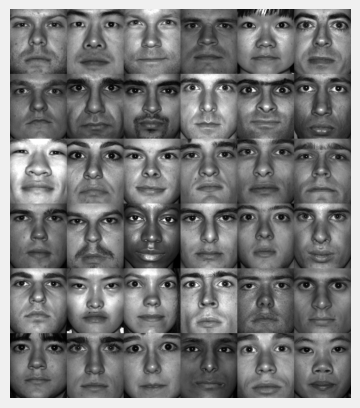

In [ ]:
allPersons = np.zeros((n*6, m*6))
count = 0

for j in range(6):
    for k in range(6):
        allPersons[j*n : (j+1)*n, k*m:(k+1)*m] = np.reshape(faces[:,np.sum(nfaces[:count])],(m,n)).T
        count += 1

img = plt.imshow(allPersons)
img.set_cmap('gray')
plt.axis('off')
plt.show()

### Figura 1: Amostra do Conjunto de Dados de Faces

Esta figura exibe as primeiras 36 imagens do conjunto de dados `allFaces.mat`. Cada imagem é um retrato de um indivíduo, e a coleção mostra variações na iluminação e na expressão facial. O objetivo da análise é encontrar uma base de "faces características" (Eigenfaces) que possa representar eficientemente todas as faces do conjunto.

Agora, mostramos cada imagem de cada rosto com os diferentes focos de luz em matrizes $8\times8$. Isso ajuda a entender a quantidade de dados que se pretende processar.

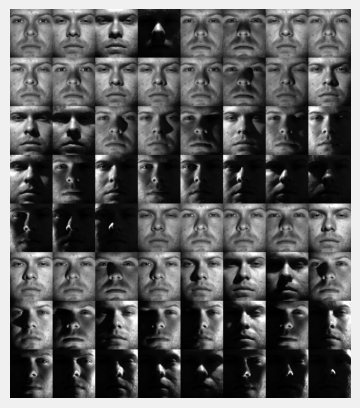

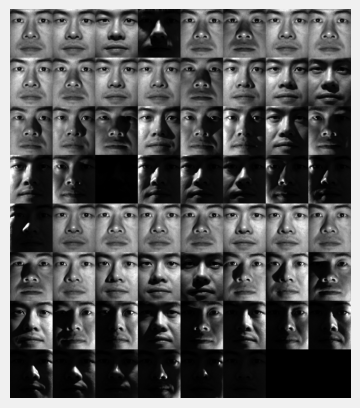

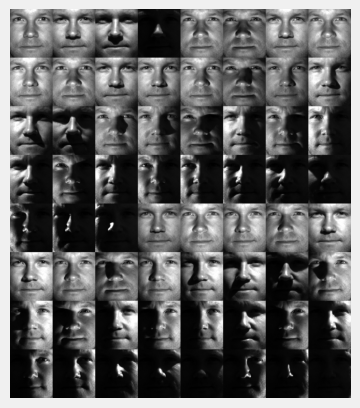

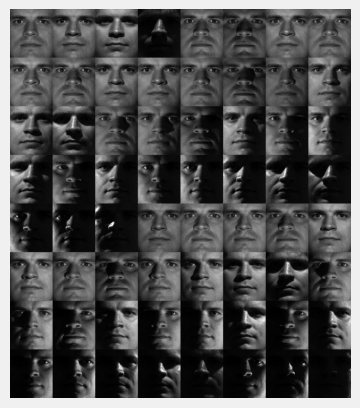

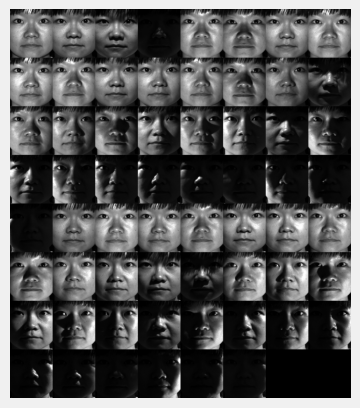

...

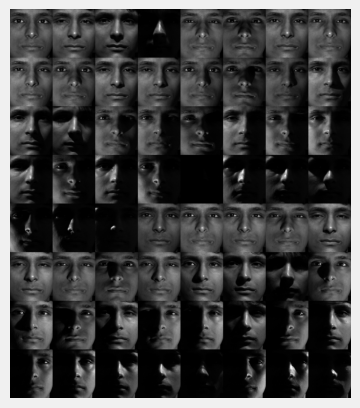

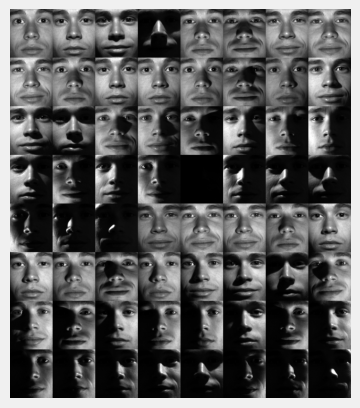

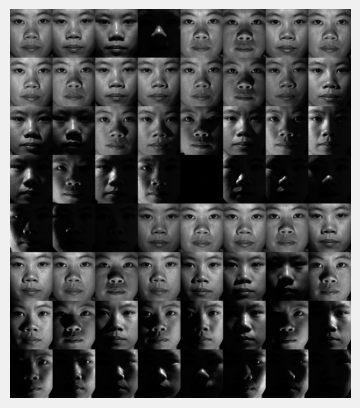

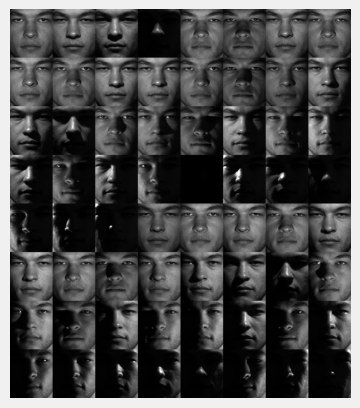

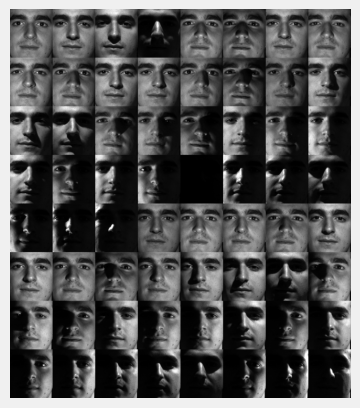

In [ ]:
# Plot de todas as faces com seu 64 imagenes
for person in range(len(nfaces)):
    subset = faces[:, np.sum(nfaces[:person]) : np.sum(nfaces[:(person+1)])]
    allFaces = np.zeros((n*8, m*8))

    count = 0

    for j in range(8):
        for k in range(8):
            if count < nfaces[person]:
                allFaces[j*n:(j+1)*n,k*m:(k+1)*m] = np.reshape(subset[:,count],(m,n)).T
                count += 1
    img = plt.imshow(allFaces)
    img.set_cmap('gray')
    plt.axis('off')
    plt.show()

Nas imagens você pode ver que as pessoas são expostas a diferentes ângulos de luz, essas imagens vão do claro ao escuro.

>**Cálculo da Face Média**
>>Calcula-se a média de todas as imagens:
$$\mu_{face} = \frac{1}{N} \sum_{i=1}^{N} A_i$$

Para encontrar las bases, primero sumamos las $36$ imagenes, y encontramos la media de las caras de imagenes `avgFace`


In [ ]:
trainingFaces = faces[:,:np.sum(nfaces[:36])]
avgFace = np.mean(trainingFaces,axis=1) # size n*m by 1

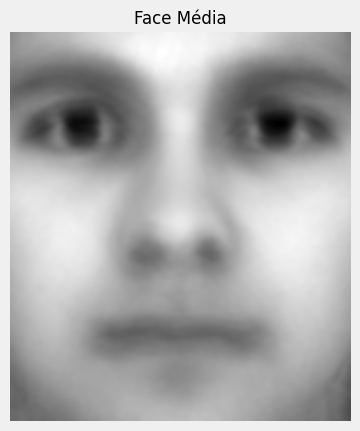

In [ ]:
# Mostra a face média
plt.imshow(np.reshape(avgFace, (m, n)).T, cmap='gray')
plt.title('Face Média', fontsize=12)
plt.axis('off')
plt.show()

### Figura 2: A Face Média

A figura acima representa a "face média", calculada como a média de todas as imagens de rostos no conjunto de dados. Esta face não corresponde a nenhum indivíduo específico, mas sim a uma composição que captura as características estatísticas comuns a todas as faces, como a posição dos olhos, nariz e boca. A face média serve como o ponto de referência a partir do qual as variações (componentes principais) são calculadas.

>**Subtração da Média**
>>Centraliza-se a matriz subtraindo a face média:
$$X_{face} = A - \mathbf{1} \mu_{face}^T$$

>**Aplicação de SVD**
>>Decompõe-se a matriz centralizada:
$$X_{face} = U \Sigma V^T$$
As colunas de $U$ são as Eigenfaces. Os valores singulares $\sigma_i$ indicam a importância de cada Eigenface.

Utilizaremos SVD com matrizes com componentes diferentes de $0$, os valores de $X$ são as matrizes das faces e subtraímos os valores das faces médias.

In [ ]:
# Calcula a SVD (Decomposição em Valores Singulares) da matriz centralizada
# Usamos 'full_matrices=False' para calcular a SVD econômica, que é mais eficiente
# U: Vetores singulares à esquerda (as Eigenfaces)
# S: Valores singulares (relacionados à variância)
# VT: Vetores singulares à direita (transpostos)
X = trainingFaces - np.tile(avgFace,(trainingFaces.shape[1],1)).T
U, S, VT = np.linalg.svd(X,full_matrices=False)

$$X_{32256\times2282} =U_{32256\times2282} \times S_{2282\times2282} \times V^T_{2282\times2282} $$

In [ ]:
print(U.shape)
print(S.shape)
print(VT.shape)
print(X.shape)

(32256, 2282)
(2282,)
(2282, 2282)
(32256, 2282)


Se mostra os componentes de sigma, eles em uma escala logaritmica.

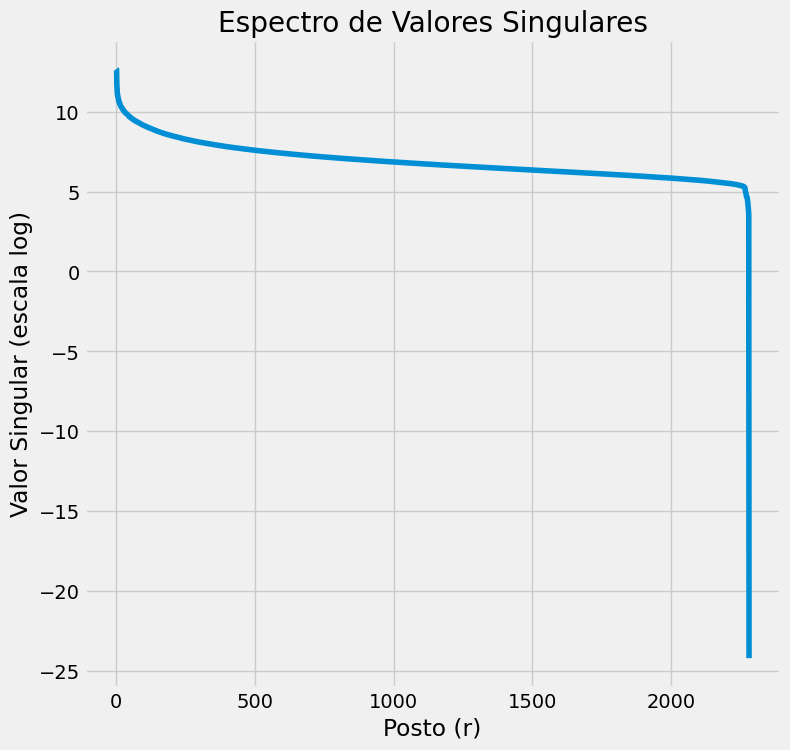

In [ ]:
# Cria uma figura com um tamanho específico
plt.figure(figsize=(8, 8))

# Plota o logaritmo dos valores singulares
plt.plot(np.log(S))
plt.xlabel('Posto (r)')
plt.ylabel('Valor Singular (escala log)')
plt.title('Espectro de Valores Singulares')
plt.show()

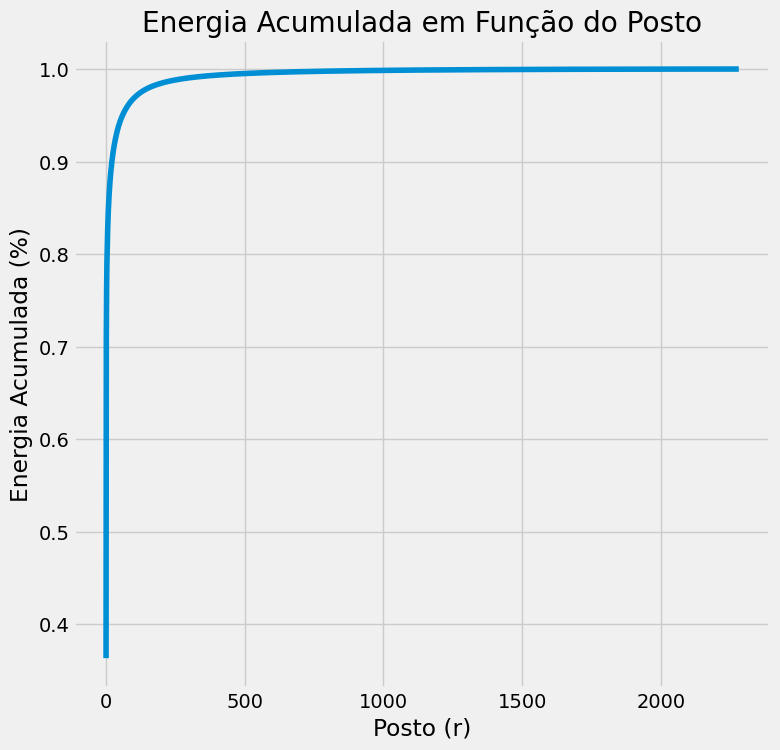

In [ ]:
# Calcula a proporção da energia (ou variância) para cada valor singular.
# Isso é feito elevando os valores singulares ao quadrado e normalizando pela soma total (energia total).
ss = np.square(S) / (np.sum(np.square(S)))

plt.figure(figsize=(8, 8))
plt.plot(np.cumsum(ss))
plt.xlabel('Posto (r)')
plt.ylabel('Energia Acumulada (%)')
plt.title('Energia Acumulada em Função do Posto')
plt.show()

Agora mostramos os primeiros $11$ vetores base de $U[~~]$

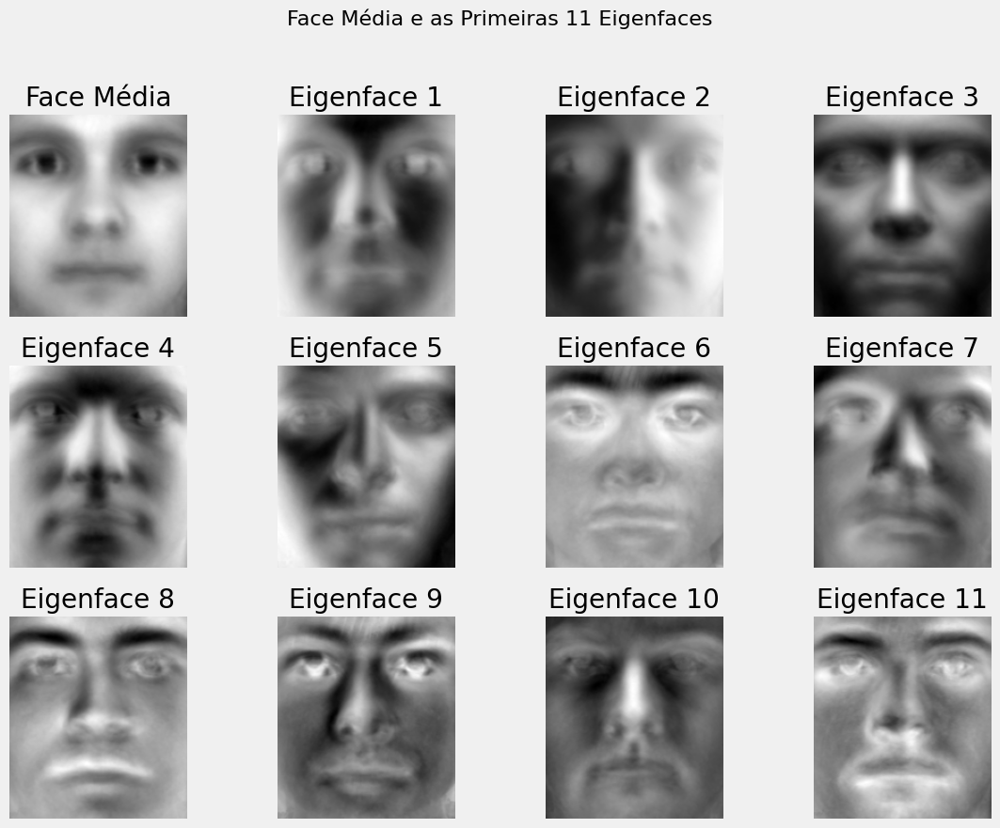

In [ ]:
fig = plt.figure(figsize=(12, 9))
fig.suptitle('Face Média e as Primeiras 11 Eigenfaces', fontsize=16)

# Subplot da Face Média
ax1 = fig.add_subplot(3, 4, 1)
ax1.imshow(np.reshape(avgFace, (m, n)).T, cmap='gray')
ax1.set_title('Face Média')
ax1.axis('off')

# Subplots das Eigenfaces (colunas de U)
for i in range(11):
    ax = fig.add_subplot(3, 4, i + 2)
    ax.imshow(np.reshape(U[:, i], (m, n)).T, cmap='gray')
    ax.set_title(f'Eigenface {i+1}')
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])

### Figura 3: As Primeiras 16 Eigenfaces

Esta figura mostra as primeiras 16 Eigenfaces, que são os componentes principais do conjunto de dados de rostos. Cada Eigenface não é um rosto real, mas sim um "vetor de características" que representa os padrões de variação mais significativos, como mudanças na iluminação e traços faciais. As primeiras Eigenfaces (com maiores valores singulares) capturam as variações mais grosseiras, enquanto as posteriores capturam detalhes mais finos.

## Eigenfaces: Reconstrução e Reconhecimento

### Processo de Reconstrução

>**Centralização da Imagem de Teste**
>>Para uma nova imagem $x_{test} \notin A$, subtrai-se a face média:
$$x_{test,cent} = x_{test} - \mu_{face}$$

>**Projeção no Espaço de Eigenfaces**
>>Projeta-se a imagem centralizada no subespaço das $r$ Eigenfaces principais:
$$x_{proj} = U_r^T x_{test,cent}$$
>onde $U_r \in \mathbb{R}^{mn \times r}$ contém as primeiras $r$ colunas de $U$.

>**Reconstrução da Imagem**
>>A imagem se reconstrói usando as Eigenfaces:
$$x_{reconst} = \mu_{face} + U_r x_{proj}$$
>Equivalentemente:
$$x_{reconst} = \mu_{face} + U_r U_r^T x_{test,cent}$$

### Fórmula Geral de Reconstrução
> Para reconstruir a coluna $j$ da matriz de dados $A_{dataset}$ usando $r$ componentes:
$$x_j = \sum_{k=1}^{r} \sigma_k \mathbf{u}_k v_{kj}$$
> onde $v_{kj}$ é o elemento $(k,j)$ de $V^T$, $\mathbf{u}_k$ é a $k$-ésima Eigenface, e $\sigma_k$ é o $k$-ésimo valor singular.


> **Análise do Erro de Reconstrução**
>> O erro de reconstrução em norma de Frobenius se expressa como:
$$\frac{\|A - A_r\|_F}{\|A\|_F}$$
O erro absoluto em norma espectral (norma-2) é:
$$\|A - A_r\|_2 = \sigma_{r+1}$$
>*Interpretação:* Quanto maior seja $r$, menor será o erro de reconstrução, mas maior será o custo computacional.

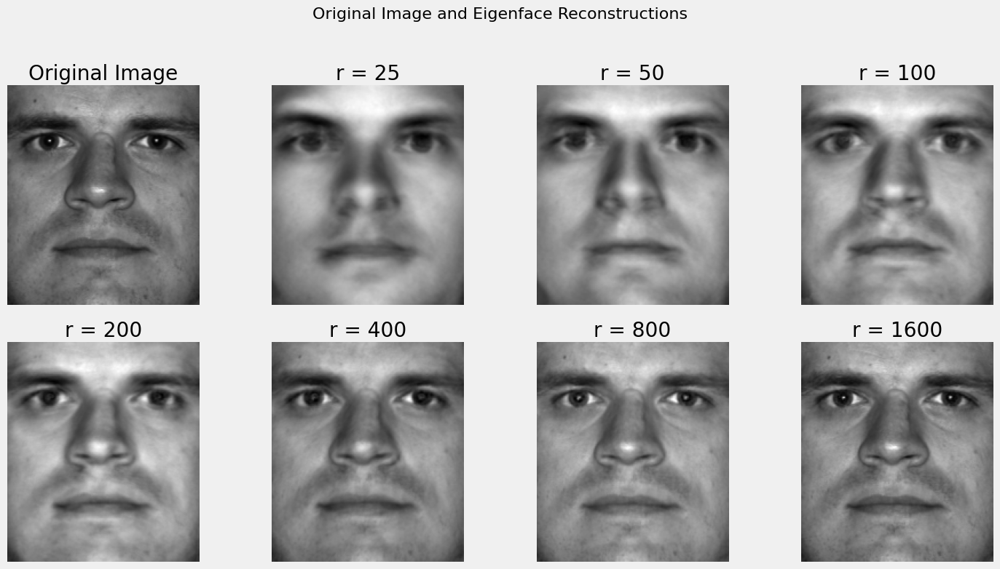

In [ ]:
## Reconstrução de uma Face
testFace = faces[:,np.sum(nfaces[:3])] # F# Seleciona uma imagem de teste, person 37
testFaceMS = testFace - avgFace

r_list = [25, 50, 100, 200, 400, 800, 1600]

num_plots = len(r_list) + 1
cols = 4
rows = (num_plots + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
fig.suptitle('Original Image and Eigenface Reconstructions', fontsize=16)

# Plot
ax = axes.flat[0]
ax.imshow(np.reshape(testFace,(m,n)).T, cmap='gray')
ax.set_title('Imagem Original')
ax.axis('off')

# Plot
for i, r in enumerate(r_list):
    # Reconstrói a imagem usando um número 'r' de Eigenfaces
    alpha=U[:,:r].T @ testFaceMS
    reconFace = avgFace + U[:,:r]  @ alpha
    ax = axes.flat[i + 1]
    ax.imshow(np.reshape(reconFace,(m,n)).T, cmap='gray')
    ax.set_title('r = ' + str(r))
    ax.axis('off')

for i in range(num_plots, rows * cols):
    axes.flat[i].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Análise de Erro de Reconstrução e Energia Acumulada**

Vamos calcular as métricas de posto (r), valor singular correspondente ($\sigma_r$), energia acumulada (em porcentagem), erro de Frobenius e erro espectral para diferentes números de componentes principais em uma lista que recorre $400$ com paso de $10$ usados na reconstrução das imagens de treinamento.

In [ ]:
# Define os valores de posto 'r' que serão avaliados (de 1 a 391, com passo 10).
r_values = np.arange(1, 400, 10)

# Inicializa listas para armazenar os resultados de cada métrica.
rank_list = []
sigma_r_list = []
energy_list = []
frobenius_error_list = []
spectral_error_list = []

# Calcula a energia total da matriz, que é a soma dos quadrados de todos os valores singulares.
total_energy = np.sum(S**2)

# Calcula a norma de Frobenius da matriz original X. Usada para normalizar o erro.
total_frobenius_norm = np.linalg.norm(X, 'fro')

# Itera sobre os diferentes valores de posto 'r' para calcular as métricas.
for r in r_values:
    # Armazena o posto 'r' atual.
    rank_list.append(r)

    # O r-ésimo valor singular (S[r-1] pois a indexação em Python começa em 0).
    sigma_r_list.append(S[r-1])

    # Calcula a energia acumulada pelos 'r' primeiros componentes.
    accumulated_energy = np.sum(S[:r]**2)
    energy_percentage = (accumulated_energy / total_energy) * 100
    energy_list.append(energy_percentage)

    # Calcula o erro relativo de Frobenius: ||A - A_r||_F / ||A||_F
    # O erro absoluto é a raiz da soma dos quadrados dos valores singulares restantes.
    frobenius_error_absoluto = np.sqrt(np.sum(S[r:]**2))
    frobenius_error_relativo = frobenius_error_absoluto / total_frobenius_norm
    frobenius_error_list.append(frobenius_error_relativo)

    # Calcula o erro na norma espectral, que é simplesmente o (r+1)-ésimo valor singular.
    # Nota: O erro da aproximação de posto 'r' é sigma_{r+1}, então usamos S[r].
    spectral_error = S[r]
    spectral_error_list.append(spectral_error)

In [ ]:
results_df = pd.DataFrame({
    'Posto (r)': rank_list,
    'Sigma_r': sigma_r_list,
    'Energia Acumulada (%)': energy_list,
    'Erro de Frobenius': frobenius_error_list,
    'Erro Espectral': spectral_error_list
})

display(results_df)

,Posto (r),Sigma_r,Energia Acumulada (%),Erro de Frobenius,Erro Espectral
0,1,317948.189835,36.335535,0.797900,311133.647079
1,11,42301.737151,85.888751,0.375649,37885.374396
2,21,28440.413453,89.733807,0.320409,27070.207517
3,31,21643.597544,91.860237,0.285303,21482.119789
4,41,18453.088379,93.283517,0.259162,18126.954004
5,51,15596.735489,94.285099,0.239059,15390.641096
6,61,13605.393160,95.039072,0.222731,13517.217582
7,71,12228.789740,95.632627,0.208983,12037.086900
8,81,11140.986481,96.113909,0.197132,11000.446360
9,91,10057.501692,96.516112,0.186652,9999.809134


Com $r = 1$, o primeiro valor singular $\sigma_1 = 317948.189835$ captura $36.335535%$ da energia total. Com $r = 101$, alcança-se $96.847764%$ de energia. O erro de Frobenius decresce de $0.797900$ $(r=1)$ a $0.082412$ $(r=391)$.

Pegando os mesmos procedimento do reconstrução de rostro o imagem, então aplicamos $2$ exemplos: uma imagen do dataset do primer trabalho e outra imagen de minha persõa de $4$ anos atras.

**Imagem de uma flor do Primer Trabalho**

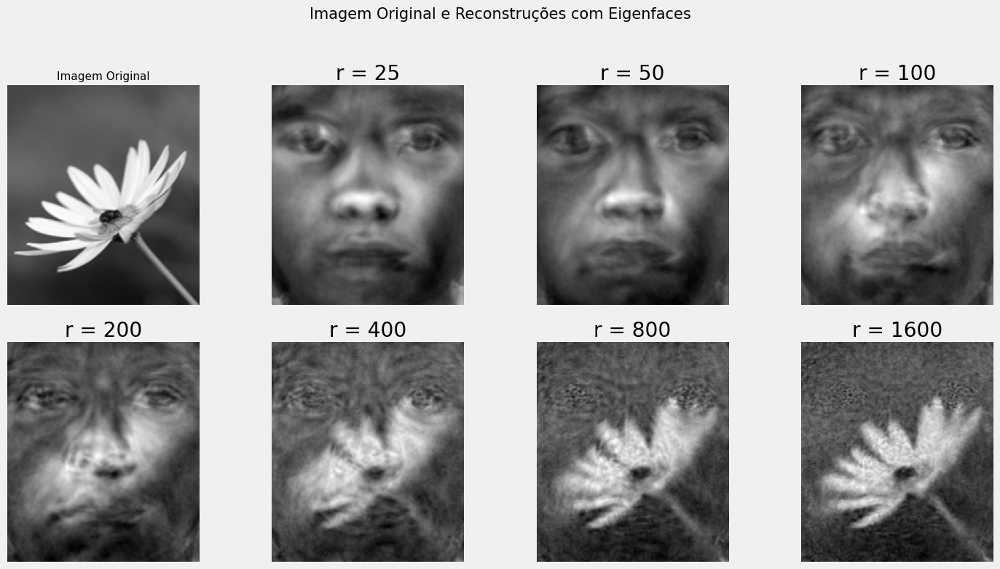

In [ ]:
test_image_path = '/content/drive/MyDrive/Colab Notebooks/Álgebra Linear CD 2025/Datos/datasets_gerados_flores/dataset_flores_25/flor_1.jpg' # Replace with the actual path to the image
img = Image.open(test_image_path)
img = img.rotate(90)
img_gray = img.convert('L')
img_resized = img_gray.resize((n,m))
testFace_new = np.array(img_resized).flatten()

# Subtrai a face média
testFaceMS_new = testFace_new - avgFace

# Lista de valores de r
r_list = [25, 50, 100, 200, 400, 800, 1600]

# Cria a grade de plots
num_plots = len(r_list) + 1
cols = 4
rows = (num_plots + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
fig.suptitle('Imagem Original e Reconstruções com Eigenfaces', fontsize=15)

# Plota a imagem original (agora corrigida)
ax = axes.flat[0]
ax.imshow(np.reshape(testFace_new, (m, n)).T, cmap='gray')
ax.set_title('Imagem Original', fontsize=11)
ax.axis('off')

# Plota as reconstruções
for i, r in enumerate(r_list):
    alpha = U[:, :r].T @ testFaceMS_new
    reconFace_new = avgFace + U[:, :r] @ alpha
    ax = axes.flat[i + 1]
    ax.imshow(np.reshape(reconFace_new, (m, n)).T, cmap='gray')
    ax.set_title('r = ' + str(r))
    ax.axis('off')

# Desliga os eixos não utilizados
for i in range(num_plots, rows * cols):
    axes.flat[i].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Representação aproximada de uma imagem de Nelson Roldan usando eigenfaces**

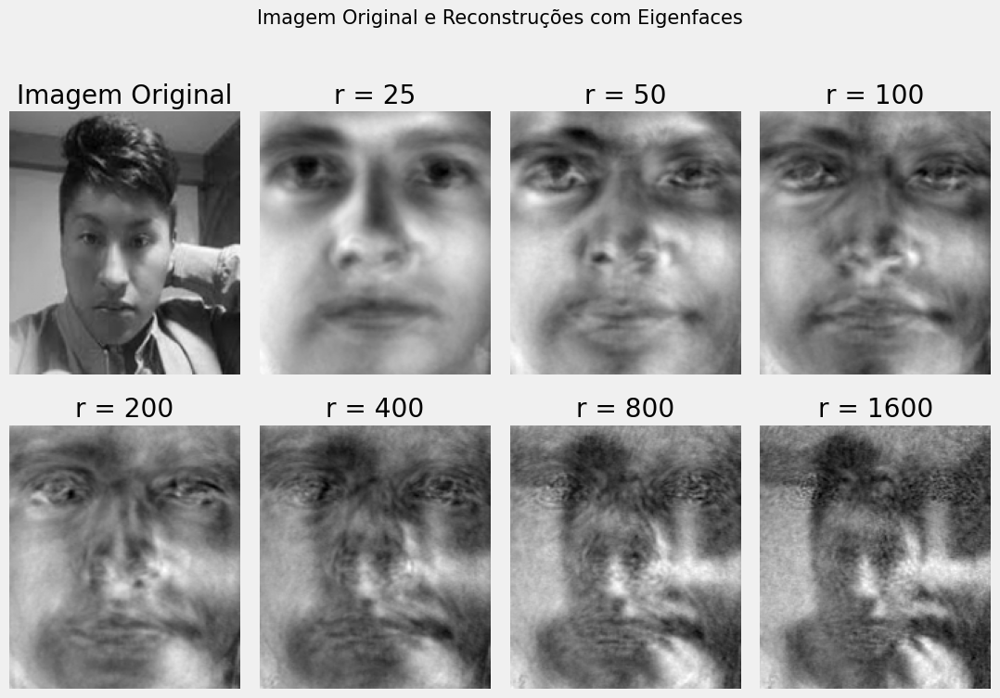

In [ ]:
# Carrega a imagem de teste
test_image_path = '/content/drive/MyDrive/Colab Notebooks/Álgebra Linear CD 2025/Datos/NelsonR.jpg' # Replace with the actual path to the image
img = Image.open(test_image_path)
img = img.rotate(90)
img_gray = img.convert('L')
img_resized = img_gray.resize((n,m))
testFace_new = np.array(img_resized).flatten()

# Subtrai a face média
testFaceMS_new = testFace_new - avgFace

# Lista de valores de r
r_list = [25, 50, 100, 200, 400, 800, 1600]

# Cria a grade de plots
num_plots = len(r_list) + 1
cols = 4
rows = (num_plots + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(11, rows * 4))
fig.suptitle('Imagem Original e Reconstruções com Eigenfaces', fontsize=15)

# Plota a imagem original (agora corrigida)
ax = axes.flat[0]
ax.imshow(np.reshape(testFace_new, (m, n)).T, cmap='gray')
ax.set_title('Imagem Original')
ax.axis('off')

# Plota as reconstruções
for i, r in enumerate(r_list):
    alpha = U[:, :r].T @ testFaceMS_new
    reconFace_new = avgFace + U[:, :r] @ alpha
    ax = axes.flat[i + 1]
    ax.imshow(np.reshape(reconFace_new, (m, n)).T, cmap='gray')
    ax.set_title('r = ' + str(r))
    ax.axis('off')

# Desliga os eixos não utilizados
for i in range(num_plots, rows * cols):
    axes.flat[i].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

As imagens mostradas que estan fora do dataset, claramente mostran que tem dificultade para reconstruir a imagen, podemos mostrar isso com os seguintes erros

In [ ]:
# Calcula a energia total da imagem de teste original (não centralizada).
total_energy_nelson = np.sum(testFace_new**2)

print("-" * 60)
print(f"{'Posto (r)':<10} | {'Energia Explicada (%)':<25} | {'Erro Relativo de Frobenius (%)':<30}")
print("-" * 60)

# Itera sobre a lista de postos 'r' para reconstruir a imagem e calcular os erros.
for i, r in enumerate(r_list):
    # Projeta a face de teste
    alpha = U[:, :r].T @ testFaceMS_new

    # Reconstrói a face somando a face média à projeção.
    reconFace_new = avgFace + U[:, :r] @ alpha

    # Calcula o erro de reconstrução no espaço centralizado (sem a face média).
    reconstruction_error_ms = testFaceMS_new - (U[:, :r] @ alpha)
    nel_error = np.reshape(reconstruction_error_ms, (m, n)).T

    # Calcula a norma de Frobenius do erro de reconstrução.
    frobenius_error_recon = np.linalg.norm(nel_error, 'fro')

    # Calcula a norma da imagem original centralizada para usar como referência no erro relativo.
    norm_original_ms = np.linalg.norm(np.reshape(testFaceMS_new, (m, n)).T, 'fro')

    # Calcula o erro relativo de Frobenius em porcentagem.
    relative_frobenius_error_recon = (frobenius_error_recon / norm_original_ms) * 100 if norm_original_ms != 0 else 0

    # A energia da reconstrução da imagem centralizada.
    energy_reconstructed_ms = np.sum((reconFace_new - avgFace)**2)
    # A energia da imagem original centralizada (variância total).
    energy_original_ms = np.sum(testFaceMS_new**2)

    # Calcula a porcentagem de energia (variância) explicada pela reconstrução com 'r' componentes.
    energy_percentage_explained_ms = (energy_reconstructed_ms / energy_original_ms) * 100 if energy_original_ms != 0 else 0

    print(f"{r:<10} | {energy_percentage_explained_ms:<25.2f} | {relative_frobenius_error_recon:<30.2f}")

print("-" * 60)

------------------------------------------------------------
Posto (r)  | Energia Explicada (%)     | Erro Relativo de Frobenius (%)
------------------------------------------------------------
25         | 72.44                     | 52.50                         
50         | 79.70                     | 45.06                         
100        | 84.58                     | 39.27                         
200        | 89.44                     | 32.49                         
400        | 92.62                     | 27.17                         
800        | 94.38                     | 23.70                         
1600       | 95.86                     | 20.35                         
------------------------------------------------------------


## Classificação dos rostos das pessoas

Para a tarefa de classificação, selecionamos duas imagens de faces do nosso conjunto de dados (indivíduos $2$ e $7$).

Conforme a literatura, notamment no livro Data-Driven Science and Engineering, os primeiros componentes principais (Eigenfaces) capturam as variações de maior energia, como as condições de iluminação, que são características gerais e pouco úteis para distinguir pessoas.

Para obter uma melhor separação, é mais eficaz utilizar componentes de ordem superior, que codificam traços faciais mais específicos e distintivos. Por essa razão, escolhemos os componentes $5$ e $6$. O gráfico a seguir demonstra como a projeção das faces neste subespaço específico permite uma classificação mais clara entre os dois indivíduos.

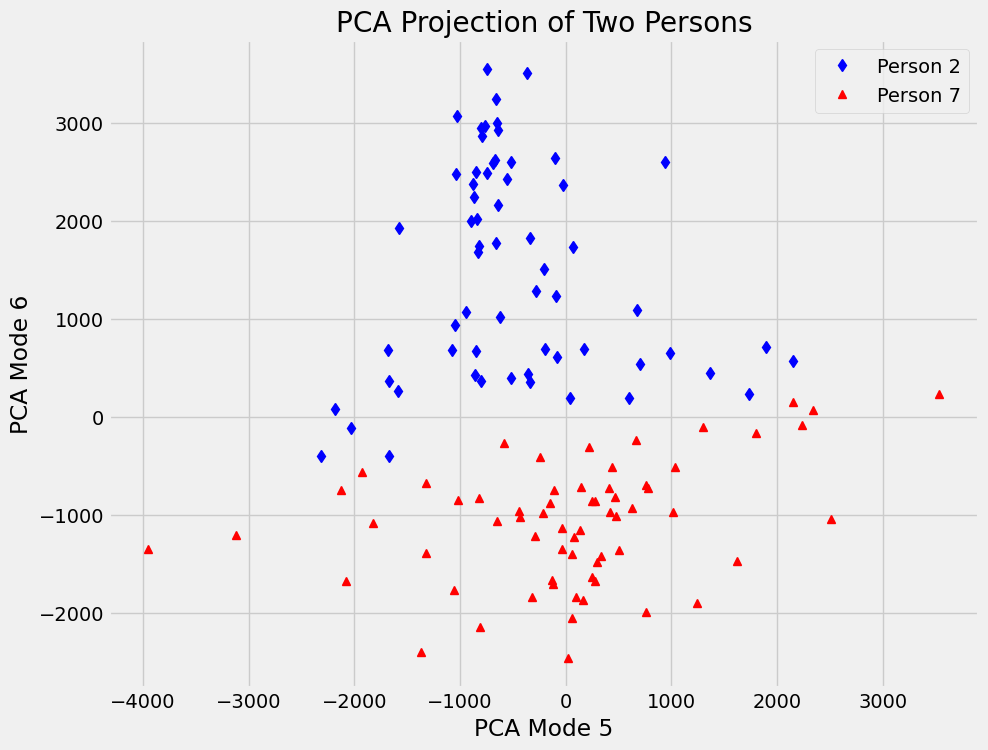

In [ ]:
# Define os números dos indivíduos a serem classificados.
P1num = 2  # Indivíduo número 2
P2num = 7  # Indivíduo número 7

# Extrai todas as faces dos indivíduos P1 e P2 do conjunto de dados.
P1 = faces[:,np.sum(nfaces[:(P1num-1)]):np.sum(nfaces[:P1num])]
P2 = faces[:,np.sum(nfaces[:(P2num-1)]):np.sum(nfaces[:P2num])]
P1 = P1 - np.tile(avgFace,(P1.shape[1],1)).T
P2 = P2 - np.tile(avgFace,(P2.shape[1],1)).T

# Define os modos da PCA (componentes) a serem usados para a projeção.
# Escolhemos modos de ordem superior para capturar características distintivas.
PCAmodes = [5, 6]

# Projeta as faces centralizadas no subespaço definido pelos modos da PCA.
PCACoordsP1 = U[:,PCAmodes-np.ones_like(PCAmodes)].T @ P1
PCACoordsP2 = U[:,PCAmodes-np.ones_like(PCAmodes)].T @ P2

plt.figure(figsize=(10, 8))
# Plota as coordenadas do indivíduo P1 (losangos azuis).
plt.plot(PCACoordsP1[0,:], PCACoordsP1[1,:], 'd', color='b', label=f'Person {P1num}')
# Plota as coordenadas do indivíduo P2 (triângulos vermelhos).
plt.plot(PCACoordsP2[0,:], PCACoordsP2[1,:], '^', color='r', label=f'Person {P2num}')

plt.xlabel(f'PCA Mode {PCAmodes[0]}')
plt.ylabel(f'PCA Mode {PCAmodes[1]}')
plt.title('PCA Projection of Two Persons')
plt.legend()
plt.grid(True)
plt.show()

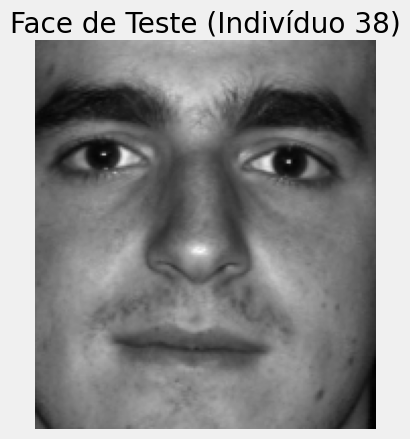

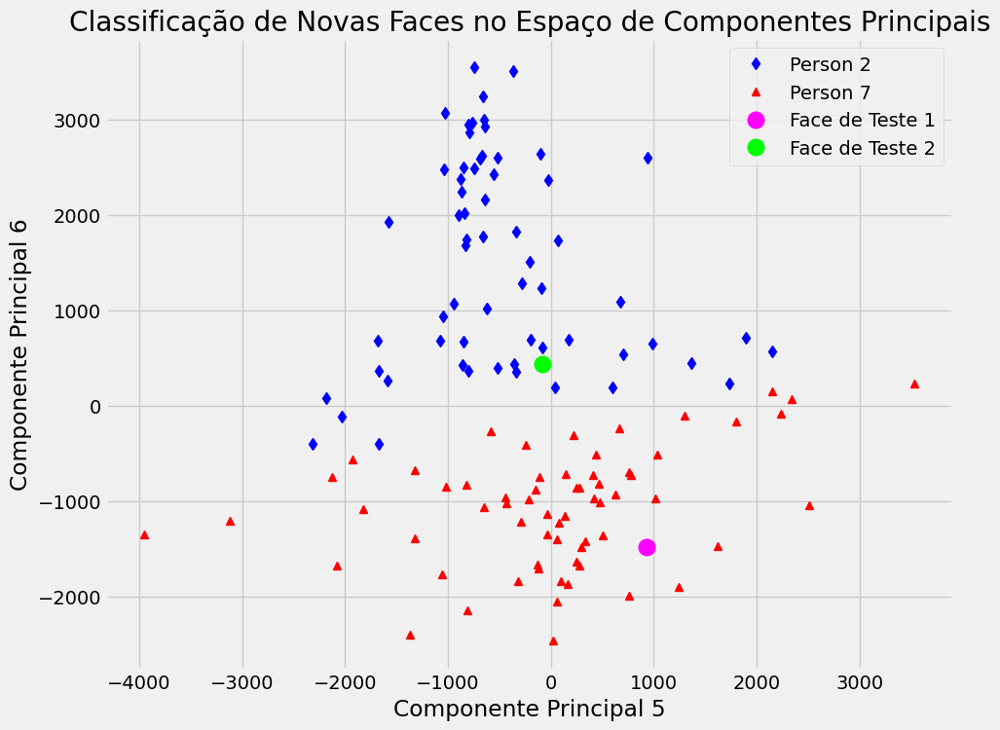

In [ ]:
# Exemplo de Classificação de Novas Faces

# Seleciona duas faces de teste. Por exemplo, a primeira face do indivíduo 38 e a primeira do indivíduo 37.
face_teste_1 = faces[:, np.sum(nfaces[:37])]
face_teste_2 = faces[:, np.sum(nfaces[:36])]

# Mostra uma das faces de teste para visualização.
plt.imshow(np.reshape(face_teste_1, (m, n)).T, cmap='gray')
plt.title('Face de Teste (Indivíduo 38)')
plt.axis('off')
plt.show()

# Centraliza as faces de teste subtraindo a face média.
face_teste_1_centralizada = face_teste_1 - avgFace
face_teste_2_centralizada = face_teste_2 - avgFace

# Define os mesmos modos da PCA usados anteriormente para a projeção.
modos_pca = [5, 6]
indices_pca = [modo - 1 for modo in modos_pca]

# Projeta as faces de teste centralizadas no subespaço da PCA.
coords_teste_1 = U[:, indices_pca].T @ face_teste_1_centralizada
coords_teste_2 = U[:, indices_pca].T @ face_teste_2_centralizada

# --- Visualização da Classificação ---
plt.figure(figsize=(10, 8))

# Plota novamente as coordenadas dos indivíduos originais.
plt.plot(PCACoordsP1[0,:], PCACoordsP1[1,:], 'd', color='b', label=f'Person {P1num}')
plt.plot(PCACoordsP2[0,:], PCACoordsP2[1,:], '^', color='r', label=f'Person {P2num}')

# Adiciona as projeções das faces de teste ao gráfico.
plt.plot(coords_teste_1[0], coords_teste_1[1], 'o', color='magenta', markersize=12, label='Face de Teste 1')
plt.plot(coords_teste_2[0], coords_teste_2[1], 'o', color='lime', markersize=12, label='Face de Teste 2')

# Configura os rótulos e o título do gráfico.
plt.xlabel(f'Componente Principal {modos_pca[0]}')
plt.ylabel(f'Componente Principal {modos_pca[1]}')
plt.title('Classificação de Novas Faces no Espaço de Componentes Principais')
plt.legend()
plt.grid(True)
plt.show()

En la grafica vemos que el punto verde que representa a una imagen de persona numero $38$ se puede clasificar como una persona que comparte rasgos con la persona $2$,que hace mas interesante que la persona $37$ de color rosado esta mas en el centro de los puntos de la persona $7$.

## EigenBeef: Análise de Componentes Principais para Classificação de Alimentos

De forma análoga à análise de rostos, aplicamos a PCA a um conjunto de dados de imagens de carne para derivar uma base de "EigenBeefs". Estas são os componentes principais que capturam as variações mais significativas em textura, cor e padrões de gordura nas imagens. A hipótese é que esta representação em um subespaço de menor dimensão pode ser utilizada para tarefas de classificação, como determinar o estado de frescura da carne de forma automatizada.

A base de dados é extraida do https://www.kaggle.com/datasets/vinayakshanawad/meat-freshness-image-dataset que tem a siguiente descripção:

* Inclui 2.266 imagens.
* Cor-Marmoreio-Frescor são anotados no formato de Classificação Multiclasse.
* Autoorientação dos dados de pixel (com remoção da orientação EXIF)
* Redimensionamento para 416x416 (Esticar)

Matematicamente, as EigenBeef são as colunas da matriz $U_{beef}$ obtida da SVD da matriz de imagens de carne centralizadas.
$$x_{beef} = \mu_{beef} + \sum_{i=1}^{r} \beta_i u_{beef,i}$$
onde $u_{beef,i}$ são as EigenBeef, $\beta_i$ são os coeficientes de projeção, e $\mu_{beef}$ é a imagem média de carne.


**Aplicação:** A análise de EigenBeef permite automatizar a inspeção de qualidade, reduzir custos operacionais e garantir padrões de segurança alimentar mediante técnicas de álgebra linear computacional.

In [ ]:
image_dir = '/content/drive/MyDrive/Colab Notebooks/Álgebra Linear CD 2025/Datos/meat beef'
image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

exportamos como figura las primeras 49 imagenes, ese seria nuestro dataset entero.

### Processo de Criação de EigenBeef
>**Vetorização de Imagens**
>>Cada imagem de carne de $m_{beef} \times n_{beef}$ pixels se converte em um vetor coluna. Forma-se $A_{beef} \in \mathbb{R}^{m_{beef} n_{beef} \times N_{beef}}$

In [ ]:
# Seleciona os primeiros 49 arquivos de imagem da lista.
selected_image_files = image_files[:49]

image_matrices = []

n_beef = 416
m_beef = 416

# Itera sobre cada caminho de imagem selecionado.
for img_path in selected_image_files:
        # Abre o arquivo de imagem.
        img = Image.open(img_path)
        # Converte a imagem para escala de cinza.
        img_gray = img.convert('L')
        # Redimensiona a imagem para o tamanho padrão definido.
        img_resized = img_gray.resize((n_beef, m_beef))
        # Converte a imagem redimensionada para um array NumPy.
        img_array = np.array(img_resized)
        # Adiciona o array da imagem à lista.
        image_matrices.append(img_array)

# Empilha todas as matrizes de imagem em um único array NumPy tridimensional.
image_matrices_array = np.array(image_matrices)

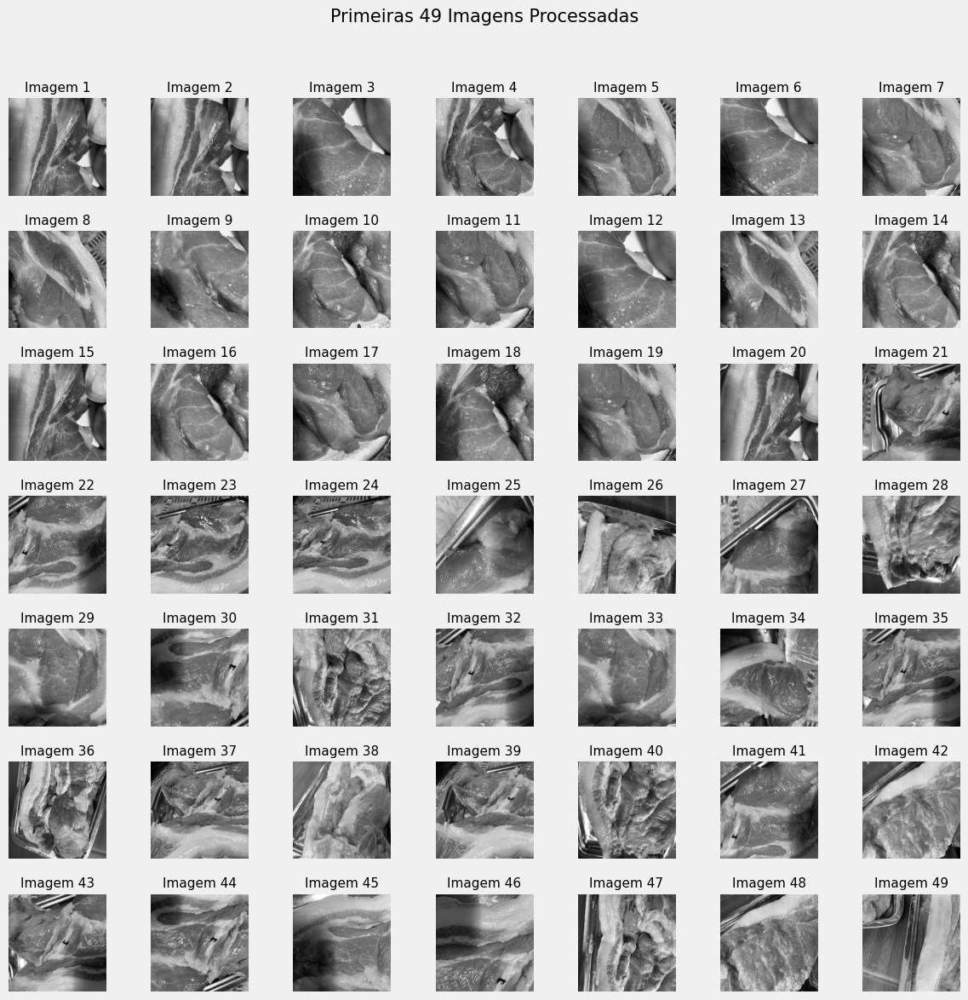

In [ ]:
# Determina o tamanho do grid de exibição (ex: 7x7 para 49 imagens).
grid_size = int(np.ceil(np.sqrt(len(image_matrices))))

# Cria a figura e os subplots com base no tamanho do grid.
fig, axes = plt.subplots(grid_size, grid_size, figsize=(12, 12))
fig.suptitle('Primeiras 49 Imagens Processadas', fontsize=15)

# Itera sobre os eixos (subplots) para exibir cada imagem.
for i, ax in enumerate(axes.flat):

    if i < len(image_matrices):
        ax.imshow(image_matrices[i], cmap='gray')
        ax.set_title(f'Imagem {i+1}', fontsize=11)
        ax.axis('off')

# Ajusta o layout para evitar sobreposição do título principal.
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
beef = np.hstack([img.flatten()[:, np.newaxis] for img in image_matrices])
print("Shape of trainingFaces_beef:", beef.shape)

Shape of trainingFaces_beef: (173056, 49)


>**Cálculo da Imagem Média**
>> Calcula-se a média de todas as imagens:
$$\mu_{beef} = \frac{1}{N_{beef}} \sum_{i=1}^{N_{beef}} A_{beef,i}$$

para proceder con la reconstruccion de la imagen usamos una matriz de 36 imagenes, la imagen media de las carnes es

In [ ]:
training_beef = beef[:,:36]
print(training_beef)
print(training_beef.shape)
avg_beef = np.mean(training_beef,axis=1) # size n*m by 1
print(avg_beef)
print(avg_beef.shape)

[[ 85 184 107 ...  17 172  75]
 [101 145 106 ...  16 177  73]
 [118  95 104 ...  16 176  65]
 ...
 [112 115 145 ... 161  11 110]
 [105 103 144 ... 118   9 114]
 [ 98  83 142 ...  79   8 123]]
(173056, 36)
[126.44444444 126.94444444 127.36111111 ... 114.16666667 110.44444444
 106.47222222]
(173056,)


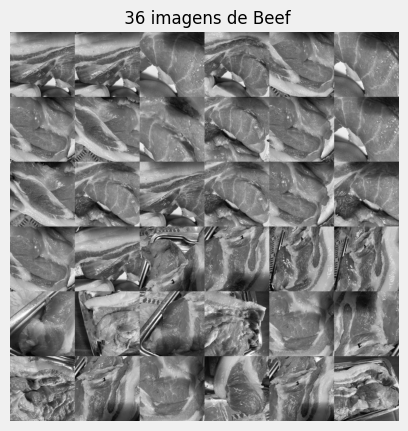

In [ ]:
allbeef = np.zeros((n_beef*6, m_beef*6))
count_beef = 0

for j in range(6):
    for k in range(6):
        allbeef[j*n_beef : (j+1)*n_beef, k*m_beef:(k+1)*m_beef] = np.reshape(beef[:,count_beef],(m_beef,n_beef)).T
        count_beef += 1

img = plt.imshow(allbeef)
img.set_cmap('gray')
plt.title(' 36 imagens de Beef', fontsize=12)
plt.axis('off')
plt.show()

>**Subtração da Média**
>> Centraliza-se a matriz:
$$X_{beef,cent} = A_{beef} - \mathbf{1} \mu_{beef}^T$$

Aplicamos SVD  para encontrar los vectores bases para la matriz de imagenes

>**Aplicação de SVD**
>>Decompõe-se a matriz centralizada:
$$X_{beef,cent} = U_{beef} \Sigma_{beef} V_{beef}^T$$
>As colunas de $U_{beef}$ são as EigenBeef.

In [ ]:
X_beef = training_beef - np.tile(avg_beef,(training_beef.shape[1],1)).T
U_beef, S_beef, VT_beef = np.linalg.svd(X_beef,full_matrices=0)

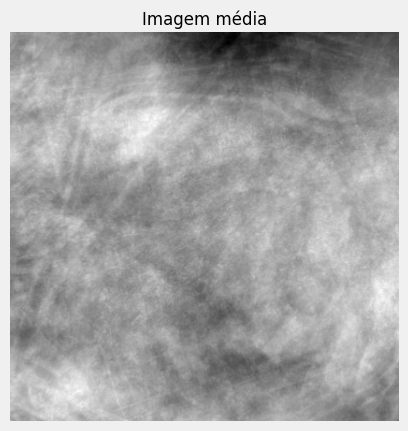

In [ ]:
plt.imshow(np.reshape(avg_beef,(m_beef,n_beef)).T, cmap="gray")
plt.title('Imagem média', fontsize=12)
plt.axis('off')
plt.show()

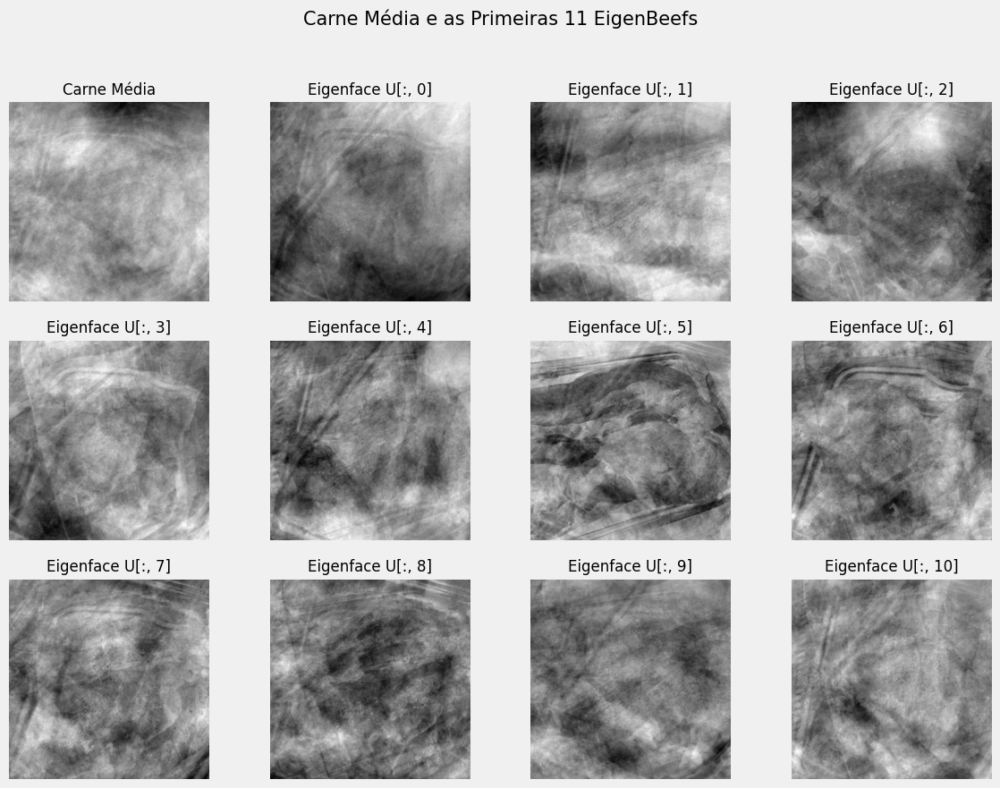

In [ ]:
fig = plt.figure(figsize=(12, 9))
fig.suptitle('Carne Média e as Primeiras 11 EigenBeefs', fontsize=15)

# Cara Promedio
ax1 = fig.add_subplot(3, 4, 1)
ax1.imshow(np.reshape(avg_beef, (m_beef, n_beef)).T, cmap='gray')
ax1.set_title('Carne Média', fontsize = 12)
ax1.axis('off')

# Subplots das EigenBeefs (colunas de U_beef)
# Itera para exibir as 11 primeiras EigenBeefs.
for i in range(11):
    ax = fig.add_subplot(3, 4, i + 2)
    ax.imshow(np.reshape(U_beef[:, i], (m_beef, n_beef)).T, cmap='gray')
    ax.set_title(f'Eigenface U[:, {i}]', fontsize=12)
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### Figura 5: Carne Média e as Primeiras 11 EigenBeefs

A figura apresenta a "carne média" e os primeiros $11$ componentes principais (EigenBeefs) do conjunto de dados de carne. A carne média (canto superior esquerdo) exibe a aparência média geral. As EigenBeefs subsequentes capturam as variações mais proeminentes nas imagens, como os padrões de gordura (marmoreio), a forma geral do corte e as variações de tonalidade que podem estar correlacionadas com a frescura.

>**Reconstrução**
>>Para uma imagem de teste:
$$x_{beef,reconst} = \mu_{beef} + U_{beef,r} U_{beef,r}^T (x_{beef,test} - \mu_{beef})$$

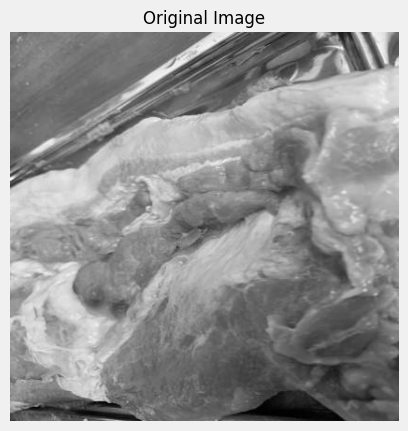

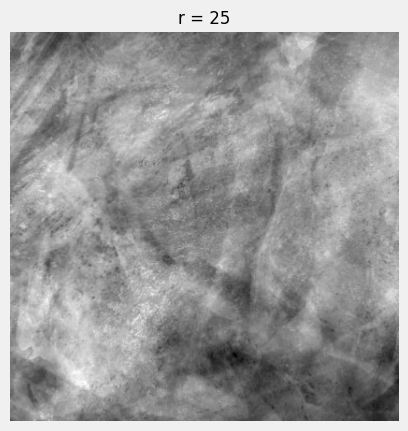

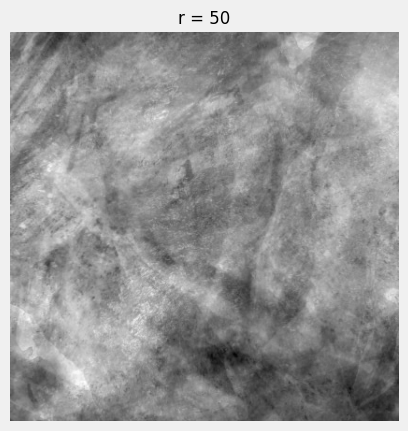

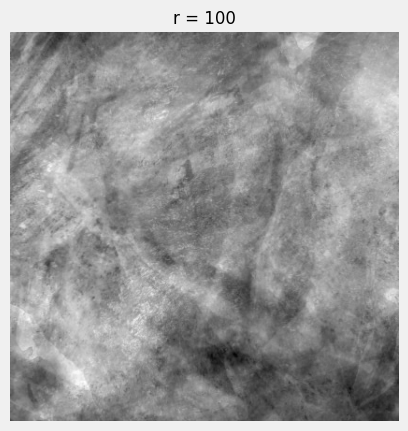

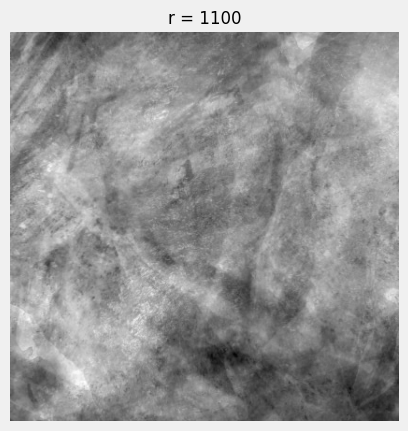

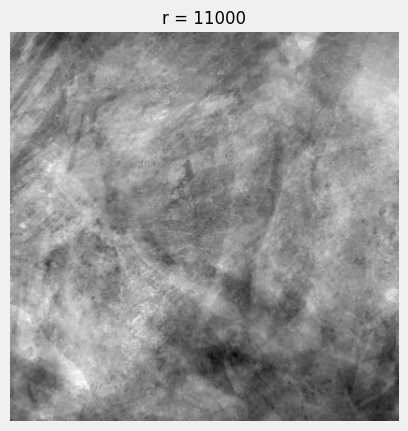

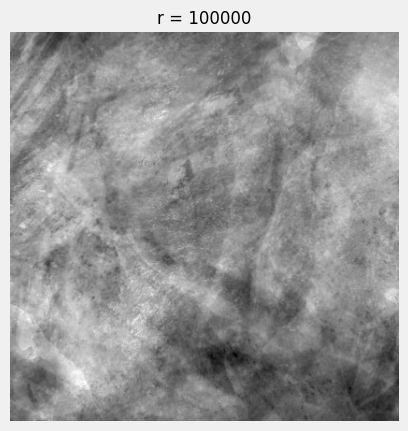

In [ ]:
testbeef = beef[:,37]
plt.imshow(np.reshape(testbeef,(m_beef,n_beef)).T)
plt.set_cmap('gray')
plt.title('Original Image', fontsize = 12)
plt.axis('off')
plt.show()

testBeefMS = testbeef - avg_beef
r_list = [25, 50,100,1100,11000,100000]

for r in r_list:
    alpha=U_beef[:,:r].T @ testBeefMS
    reconBeef = avg_beef + U_beef[:,:r]  @ alpha
    img = plt.imshow(np.reshape(reconBeef,(m_beef,n_beef)).T)
    img.set_cmap('gray')
    plt.title('r = ' + str(r),fontsize= 12)
    plt.axis('off')
    plt.show()

###Análise de Resultados Experimentais

>**Dataset: $49$ Imagens de Carne ($173056\times 49$)**
>>O dataset consiste em muitas imagenes mas nos pegamos só $49$ imagens de carne de $416\times416$ pixels, classificadas em três categorias: Fresh , Half-Fresh e Spoiled. Cada imagem se vetoriza em um vetor de $173056$ elementos.

>**Especificações da Análise**
>* Matriz de dados: $A_{beef} \in \mathbb{R}^{173056\times 49}$
>* SVD econômica: $\tilde{U}_{beef} \in \mathbb{R}^{173056\times 49}$
>* Imagens de treinamento: $36$ primeiras imagens
>* Imagens de teste: Imagem $37$ em diante
          
*Reconstrução com Posto Reduzido*
Para a reconstrução de uma imagem de teste $x_{beef,test}$, foram utilizados diferentes valores de $r=[25, 50,100,1100,11000,100000]$. Os experimentos mostraram que com $r = 11\times 10^3$ e $r = 10^5$ obtêm-se reconstruções aceitáveis, capturando as características essenciais de textura e cor da carne.

**Variância Explicada por Componentes Principais**

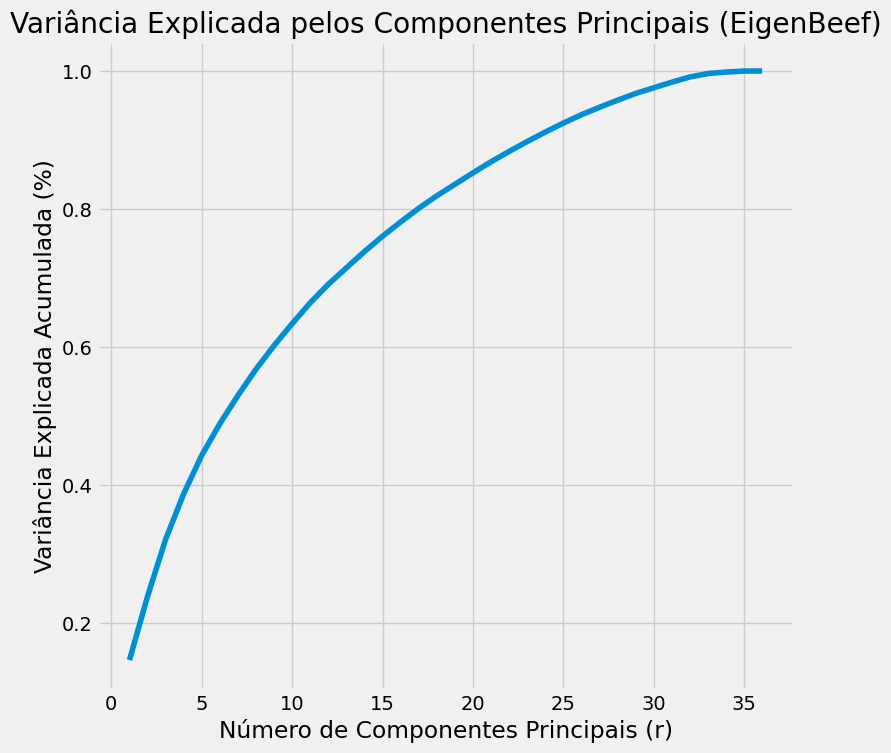

In [ ]:
# Calcula a energia de cada componente (valores singulares ao quadrado) e normaliza pela energia total.
ss_beef = np.square(S_beef) / (np.sum(np.square(S_beef)))
# Calcula a soma acumulada da energia (variância explicada).
cumulative_variance_beef = np.cumsum(ss_beef)

# --- Visualização da Variância Explicada ---
plt.figure(figsize=(8, 8))
# Plota a curva de variância explicada acumulada.
plt.plot(range(1, len(cumulative_variance_beef) + 1), cumulative_variance_beef)

# Define os rótulos e o título do gráfico.
plt.xlabel('Número de Componentes Principais (r)')
plt.ylabel('Variância Explicada Acumulada (%)')
plt.title('Variância Explicada pelos Componentes Principais (EigenBeef)')
plt.grid(True)
plt.show()

 > **Distribuição de Classes no Espaço PCA**
>>Os primeiros componentes principais capturam as variações mais significativas nas imagens de carne. A projeção no espaço PCA permite separar visualmente as três classes (Fresh, Half-Fresh, Spoiled) baseando-se em características de textura, cor e degradação.
  
*Observações Chave*
* Os primeiros 3 PCs explicam mais da variância total.
* A separação entre classes é mais evidente em PC1 e PC2.
* A reconstrução com $r \geq 25$ preserva características visuais críticas.

In [ ]:
# --- Projeção de Grupos de Imagens no Espaço PCA ---

# Define os índices para dois grupos distintos de imagens de carne.
# Grupo 1: As primeiras 20 imagens (índices 0 a 19).
indices_grupo1_beef = range(20)
# Grupo 2: As próximas 29 imagens (índices 20 a 48).
indices_grupo2_beef = range(20, 49)

# Seleciona as matrizes de imagem correspondentes para cada grupo.
grupo1_beef = beef[:, indices_grupo1_beef]
grupo2_beef = beef[:, indices_grupo2_beef]

# Centraliza os dados de cada grupo subtraindo a "carne média".
# O broadcasting (avg_beef[:, np.newaxis]) é mais eficiente que np.tile.
grupo1_beef_centralizado = grupo1_beef - avg_beef[:, np.newaxis]
grupo2_beef_centralizado = grupo2_beef - avg_beef[:, np.newaxis]

# Define os modos da PCA (componentes) a serem usados para a projeção.
# Utilizar os dois primeiros componentes principais é uma ótima escolha para visualização inicial.
modos_pca_beef = [1, 2]
# Converte os modos para índices baseados em zero (índice = modo - 1).
indices_pca_beef = [modo - 1 for modo in modos_pca_beef]

# Projeta cada grupo de imagens no subespaço definido pelos modos da PCA.
coords_pca_grupo1_beef = U_beef[:, indices_pca_beef].T @ grupo1_beef_centralizado
coords_pca_grupo2_beef = U_beef[:, indices_pca_beef].T @ grupo2_beef_centralizado

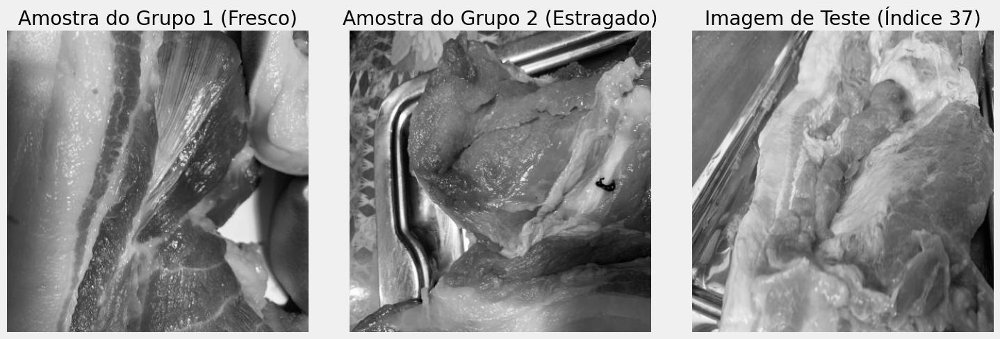

In [ ]:
# --- Preparação da Imagem de Teste ---

# Seleciona uma imagem de teste do conjunto de dados (por exemplo, a de índice 37).
indice_teste_beef = 37
imagem_teste_beef = beef[:, indice_teste_beef]

# Exibe imagens representativas dos grupos e a imagem de teste.
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Exibe uma imagem do Grupo 1 (associado a 'Fresco').
axes[0].imshow(np.reshape(grupo1_beef[:, 0], (m_beef, n_beef)), cmap='gray')
axes[0].set_title('Amostra do Grupo 1 (Fresco)')
axes[0].axis('off')

# Exibe uma imagem do Grupo 2 (associado a 'Estragado').
axes[1].imshow(np.reshape(grupo2_beef[:, 0], (m_beef, n_beef)), cmap='gray')
axes[1].set_title('Amostra do Grupo 2 (Estragado)')
axes[1].axis('off')

# Exibe a imagem de teste.
axes[2].imshow(np.reshape(imagem_teste_beef, (m_beef, n_beef)), cmap='gray')
axes[2].set_title(f'Imagem de Teste (Índice {indice_teste_beef})')
axes[2].axis('off')

plt.tight_layout()
plt.show()

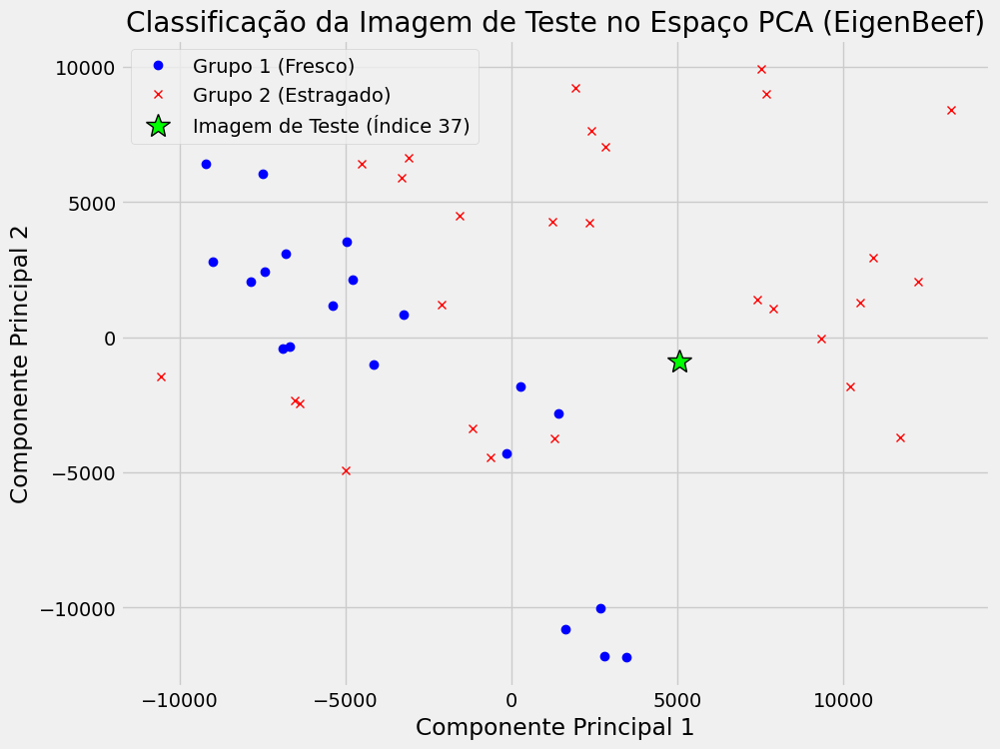

In [ ]:
# Centraliza a imagem de teste subtraindo a "carne média".
imagem_teste_beef_centralizada = imagem_teste_beef - avg_beef

# Projeta a imagem de teste nos mesmos modos da PCA.
coords_pca_teste_beef = U_beef[:, indices_pca_beef].T @ imagem_teste_beef_centralizada

# --- Gráfico de Classificação ---
plt.figure(figsize=(10, 8))

# Plota os pontos do Grupo 1.
plt.plot(coords_pca_grupo1_beef[0, :], coords_pca_grupo1_beef[1, :], 'o', color='b', label='Grupo 1 (Fresco)')
# Plota os pontos do Grupo 2.
plt.plot(coords_pca_grupo2_beef[0, :], coords_pca_grupo2_beef[1, :], 'x', color='r', label='Grupo 2 (Estragado)')
# Plota a projeção da imagem de teste.
plt.plot(coords_pca_teste_beef[0], coords_pca_teste_beef[1], '*', color='lime', markersize=18, markeredgecolor='black', label=f'Imagem de Teste (Índice {indice_teste_beef})')

# Configura os rótulos e o título.
plt.xlabel(f'Componente Principal {modos_pca_beef[0]}')
plt.ylabel(f'Componente Principal {modos_pca_beef[1]}')
plt.title('Classificação da Imagem de Teste no Espaço PCA (EigenBeef)')
plt.legend()
plt.grid(True)
plt.show()

## Discussão e Conclusões

| Aspecto        | Eigenfaces                 |EigenBeef                       |
| -------------  |:--------------------------:|:------------------------------:|
| Domínio        | Reconhecimento facial      | Controle de qualidade de carne |
| Dataset        | $38$ pessoas, $32928×38$   | $36$ imagens, $173056×36 $     |
| Características| Iluminação, expressão, pose| Textura, cor, frescura         |
| Metodologia    |                  SVD + PCA |      SVD + PCA                 |
| Aplicação      | Segurança, biometria       | Indústria alimentícia         |

>**Observações**
* Crescimento logarítmico: A energia acumulada cresce logaritmicamente com o posto $r$, alcançando $96.847764%$ com apenas $r=101$ em Eigenfaces.
* Erro de reconstrução:O erro de Frobenius decresce de $0.79790$ ($r=1$) a $0.09$ ($r=37$), enquanto o erro espectral $\|A - A_r\|_2 = \sigma_{r+1}$ quantifica o pior caso.
* Dimensionalidade ótima: O equilíbrio entre precisão e custo computacional sugere $r \approx 10^3-10^4$ para aplicações práticas.

>**Aplicações e Extensões**
>Reconhecimento facial:</strong> Sistemas de segurança, autenticação biométrica, busca de pessoas.
>Controle de qualidade:</strong> Inspeção automatizada na indústria alimentícia, detecção de anomalias.
>Compressão de dados:</strong> Redução de dimensionalidade preservando informação essencial.
>Análise exploratória:</strong> Visualização de dados de alta dimensionalidade em espaços de menor dimensão.